<a href="https://colab.research.google.com/github/jiyeonlee-2930/Math-in-AI/blob/main/boarding_sim_colab(video).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 비행기 탑승 시뮬레이터 — 데이터 모델
**Seat / Passenger / Airplane** 세 클래스를 구현합니다.

셀 1에서 파일을 생성하고, 셀 2에서 컴파일 및 동작을 확인합니다.

In [1]:
%%shell
mkdir -p boardingsim

# ── Seat.java ──────────────────────────────────────────────────
cat > boardingsim/Seat.java << 'JAVA_EOF'
package boardingsim;

public class Seat {

    public enum Status { EMPTY, OCCUPIED, RESERVED }
    public enum SeatType { WINDOW, MIDDLE, AISLE }

    private final int row;
    private final int col;
    private Status status;

    public Seat(int row, int col) {
        this.row = row;
        this.col = col;
        this.status = Status.EMPTY;
    }

    public SeatType getSeatType() {
        return switch (col) {
            case 0, 5 -> SeatType.WINDOW;
            case 1, 4 -> SeatType.MIDDLE;
            default   -> SeatType.AISLE;
        };
    }

    public int countBlockingSeats(Seat[][] seats) {
        int count = 0;
        if (col == 0) {
            if (seats[row][2].status == Status.OCCUPIED) count++;
            if (seats[row][1].status == Status.OCCUPIED) count++;
        } else if (col == 1) {
            if (seats[row][2].status == Status.OCCUPIED) count++;
        } else if (col == 5) {
            if (seats[row][3].status == Status.OCCUPIED) count++;
            if (seats[row][4].status == Status.OCCUPIED) count++;
        } else if (col == 4) {
            if (seats[row][3].status == Status.OCCUPIED) count++;
        }
        return count;
    }

    public int getRow()       { return row; }
    public int getCol()       { return col; }
    public Status getStatus() { return status; }
    public void setStatus(Status status) { this.status = status; }
    public boolean isEmpty()    { return status == Status.EMPTY; }
    public boolean isOccupied() { return status == Status.OCCUPIED; }

    @Override
    public String toString() {
        char colLetter = (char)('A' + col);
        return "Seat[" + (row + 1) + colLetter + "," + status + "]";
    }
}
JAVA_EOF

# ── Passenger.java ─────────────────────────────────────────────
cat > boardingsim/Passenger.java << 'JAVA_EOF'
package boardingsim;

public class Passenger {

    public enum State {
        WAITING, IN_AISLE, STORING_BAGGAGE, WAITING_INTERFERENCE, SEATED
    }

    public static final int INTERFERENCE_DELAY_PER_PERSON = 2;

    private final int id;
    private final int targetRow;
    private final int targetCol;
    private final int baggageTime;
    private State state;
    private int aislePosition;
    private int baggageTicksLeft;
    private int interferenceTicksLeft;
    private int waitTicks;

    public Passenger(int id, int targetRow, int targetCol, int baggageTime) {
        this.id = id;
        this.targetRow = targetRow;
        this.targetCol = targetCol;
        this.baggageTime = baggageTime;
        this.state = State.WAITING;
        this.aislePosition = -1;
        this.baggageTicksLeft = baggageTime;
        this.interferenceTicksLeft = 0;
        this.waitTicks = 0;
    }

    public Passenger(int id, int targetRow, int targetCol) {
        this(id, targetRow, targetCol, 1);
    }

    public void enterAisle(int startRow) {
        this.state = State.IN_AISLE;
        this.aislePosition = startRow;
    }

    public void moveForward() { aislePosition++; }

    public void startStoringBaggage() {
        this.state = State.STORING_BAGGAGE;
        this.baggageTicksLeft = baggageTime;
    }

    public boolean tickBaggage() {
        if (baggageTicksLeft > 0) baggageTicksLeft--;
        return baggageTicksLeft == 0;
    }

    public void startInterference(int blockingCount) {
        this.state = State.WAITING_INTERFERENCE;
        this.interferenceTicksLeft = blockingCount * INTERFERENCE_DELAY_PER_PERSON;
    }

    public boolean tickInterference() {
        if (interferenceTicksLeft > 0) interferenceTicksLeft--;
        return interferenceTicksLeft == 0;
    }

    public void seat()         { this.state = State.SEATED; }
    public void addWaitTick()  { waitTicks++; }

    public boolean isWaiting()             { return state == State.WAITING; }
    public boolean isInAisle()             { return state == State.IN_AISLE; }
    public boolean isStoringBaggage()      { return state == State.STORING_BAGGAGE; }
    public boolean isWaitingInterference() { return state == State.WAITING_INTERFERENCE; }
    public boolean isSeated()              { return state == State.SEATED; }
    public boolean isBlockingAisle() {
        return state == State.STORING_BAGGAGE || state == State.WAITING_INTERFERENCE;
    }
    public boolean hasReachedTargetRow()   { return aislePosition == targetRow; }

    public int getId()                    { return id; }
    public int getTargetRow()             { return targetRow; }
    public int getTargetCol()             { return targetCol; }
    public int getBaggageTime()           { return baggageTime; }
    public State getState()               { return state; }
    public int getAislePosition()         { return aislePosition; }
    public int getBaggageTicksLeft()      { return baggageTicksLeft; }
    public int getInterferenceTicksLeft() { return interferenceTicksLeft; }
    public int getWaitTicks()             { return waitTicks; }

    @Override
    public String toString() {
        char colLetter = (char)('A' + targetCol);
        return String.format("P%d->%d%c[%s]", id, targetRow + 1, colLetter, state);
    }
}
JAVA_EOF

# ── Airplane.java ──────────────────────────────────────────────
cat > boardingsim/Airplane.java << 'JAVA_EOF'
package boardingsim;

import java.util.*;

public class Airplane {

    public static final int ROWS = 30;
    public static final int COLS = 6;

    private final Seat[][] seats;
    private final Passenger[] aisleOccupant;

    public Airplane() {
        seats = new Seat[ROWS][COLS];
        aisleOccupant = new Passenger[ROWS];
        for (int r = 0; r < ROWS; r++)
            for (int c = 0; c < COLS; c++)
                seats[r][c] = new Seat(r, c);
    }

    public Seat getSeat(int row, int col) { return seats[row][col]; }

    public void occupy(int row, int col) {
        seats[row][col].setStatus(Seat.Status.OCCUPIED);
    }

    public boolean isRowFull(int row) {
        for (int c = 0; c < COLS; c++)
            if (!seats[row][c].isOccupied()) return false;
        return true;
    }

    public boolean isFullyOccupied() {
        for (int r = 0; r < ROWS; r++)
            if (!isRowFull(r)) return false;
        return true;
    }

    public int countSeated() {
        int count = 0;
        for (int r = 0; r < ROWS; r++)
            for (int c = 0; c < COLS; c++)
                if (seats[r][c].isOccupied()) count++;
        return count;
    }

    public boolean isAisleFree(int row) {
        return row >= 0 && row < ROWS && aisleOccupant[row] == null;
    }

    public void placeInAisle(Passenger p, int row) {
        if (row >= 0 && row < ROWS) aisleOccupant[row] = p;
    }

    public void removeFromAisle(int row) {
        if (row >= 0 && row < ROWS) aisleOccupant[row] = null;
    }

    public Passenger getAisleOccupant(int row) {
        if (row < 0 || row >= ROWS) return null;
        return aisleOccupant[row];
    }

    public boolean canMoveForward(Passenger p) {
        int nextRow = p.getAislePosition() - 1;
        if (nextRow < 0) return false;
        return isAisleFree(nextRow);
    }

    public void movePassengerForward(Passenger p) {
        int cur = p.getAislePosition();
        removeFromAisle(cur);
        p.moveForward();
        placeInAisle(p, p.getAislePosition());
    }

    public int getInterferenceCount(int row, int col) {
        return seats[row][col].countBlockingSeats(seats);
    }

    public void reset() {
        for (int r = 0; r < ROWS; r++) {
            aisleOccupant[r] = null;
            for (int c = 0; c < COLS; c++)
                seats[r][c].setStatus(Seat.Status.EMPTY);
        }
    }

    public Seat[][] getSeats() { return seats; }

    public List<int[]> getAllSeatPositions() {
        List<int[]> positions = new ArrayList<>();
        for (int r = 0; r < ROWS; r++)
            for (int c = 0; c < COLS; c++)
                positions.add(new int[]{r, c});
        return positions;
    }

    public String render() {
        StringBuilder sb = new StringBuilder();
        sb.append("     A  B  C     D  E  F\n");
        for (int r = 0; r < ROWS; r++) {
            sb.append(String.format("%2d | ", r + 1));
            for (int c = 0; c < COLS; c++) {
                if (c == 3) sb.append("  ");
                sb.append(switch (seats[r][c].getStatus()) {
                    case EMPTY    -> " . ";
                    case OCCUPIED -> " X ";
                    case RESERVED -> " r ";
                });
            }
            Passenger ap = aisleOccupant[r];
            if (ap != null) sb.append(" <P").append(ap.getId()).append(">");
            sb.append("\n");
        }
        sb.append("   Seated: ").append(countSeated()).append("/").append(ROWS * COLS);
        return sb.toString();
    }
}
JAVA_EOF

echo '✅ 자바 파일 3개 생성 완료 (boardingsim/ 폴더)'

✅ 자바 파일 3개 생성 완료 (boardingsim/ 폴더)


In [2]:
%%shell

# ── ModelTest.java (동작 확인용) ───────────────────────────────
cat > boardingsim/ModelTest.java << 'JAVA_EOF'
package boardingsim;

public class ModelTest {
    public static void main(String[] args) {

        System.out.println("=== Seat 타입 판별 ===");
        Seat a1 = new Seat(0, 0);
        Seat b1 = new Seat(0, 1);
        Seat c1 = new Seat(0, 2);
        Seat f1 = new Seat(0, 5);
        System.out.println(a1 + " -> " + a1.getSeatType()); // WINDOW
        System.out.println(b1 + " -> " + b1.getSeatType()); // MIDDLE
        System.out.println(c1 + " -> " + c1.getSeatType()); // AISLE
        System.out.println(f1 + " -> " + f1.getSeatType()); // WINDOW

        System.out.println("\n=== Passenger 상태 전환 ===");
        Passenger p = new Passenger(1, 5, 0, 2); // 6A석, baggage=2틱
        System.out.println("초기:         " + p.getState());
        p.enterAisle(29);
        System.out.println("복도 진입:    " + p.getState() + " pos=" + p.getAislePosition());
        p.startStoringBaggage();
        System.out.println("짐 싣기:      " + p.getState() + " left=" + p.getBaggageTicksLeft());
        p.tickBaggage();
        boolean done = p.tickBaggage();
        System.out.println("2틱 후 완료:  " + done + " state=" + p.getState());

        System.out.println("\n=== Airplane 복도/착석 ===");
        Airplane plane = new Airplane();
        System.out.println("총 좌석: " + (Airplane.ROWS * Airplane.COLS));

        Passenger p1 = new Passenger(1, 10, 0);
        p1.enterAisle(15);
        plane.placeInAisle(p1, 15);
        System.out.println("15행 점유:     " + (plane.getAisleOccupant(15) != null));
        System.out.println("14행 비어있음: " + plane.isAisleFree(14));

        plane.occupy(10, 2); // 11C 통로 먼저 착석
        int n = plane.getInterferenceCount(10, 0); // 11A 창가로 이동할 때
        System.out.println("11A interference: " + n + "명 (기대: 1)");

        plane.occupy(10, 0);
        System.out.println("총 착석: " + plane.countSeated());

        System.out.println("\n=== 비행기 앞 5행 ===");
        plane.occupy(0, 0); plane.occupy(1, 3); plane.occupy(2, 5);
        String[] lines = plane.render().split("\n");
        for (int i = 0; i < 7; i++) System.out.println(lines[i]);
        System.out.println("...");
        System.out.println(lines[lines.length - 1]);
    }
}
JAVA_EOF

# 컴파일
javac boardingsim/*.java && echo '✅ 컴파일 성공'

# 실행
echo ''
java -cp . boardingsim.ModelTest

✅ 컴파일 성공

=== Seat 타입 판별 ===
Seat[1A,EMPTY] -> WINDOW
Seat[1B,EMPTY] -> MIDDLE
Seat[1C,EMPTY] -> AISLE
Seat[1F,EMPTY] -> WINDOW

=== Passenger 상태 전환 ===
초기:         WAITING
복도 진입:    IN_AISLE pos=29
짐 싣기:      STORING_BAGGAGE left=2
2틱 후 완료:  true state=STORING_BAGGAGE

=== Airplane 복도/착석 ===
총 좌석: 180
15행 점유:     true
14행 비어있음: true
11A interference: 1명 (기대: 1)
총 착석: 2

=== 비행기 앞 5행 ===
     A  B  C     D  E  F
 1 |  X  .  .    .  .  . 
 2 |  .  .  .    X  .  . 
 3 |  .  .  .    .  .  X 
 4 |  .  .  .    .  .  . 
 5 |  .  .  .    .  .  . 
 6 |  .  .  .    .  .  . 
...
   Seated: 5/180


## 2단계 — 탑승 전략 (BoardingStrategy)

| 전략 | 설명 |
|---|---|
| **Random** | 완전 무작위 줄서기 |
| **Back-to-Front** | 뒤 행 → 앞 행 순서 |
| **Outside-In (Wilma)** | 창가 → 중간 → 통로 순서 |
| **Steffen** | 짝수/홀수 행 번갈아, 창가부터 (이론상 최속) |
| **Block Method** | 후방/중간/전방 3구역, 구역 내 무작위 |

> 셀 3에서 파일 생성, 셀 4에서 컴파일 + 큐 검증을 실행합니다.

In [3]:
%%shell

# ── BoardingStrategy.java (인터페이스) ────────────────────────
cat > boardingsim/BoardingStrategy.java << 'JAVA_EOF'
package boardingsim;

import java.util.*;

public interface BoardingStrategy {
    String getName();
    List<Passenger> createQueue(int baggageTime);

    static List<int[]> allSeats() {
        List<int[]> seats = new ArrayList<>();
        for (int r = 0; r < Airplane.ROWS; r++)
            for (int c = 0; c < Airplane.COLS; c++)
                seats.add(new int[]{r, c});
        return seats;
    }
}
JAVA_EOF

# ── Strategies.java (5가지 전략 구현체 + StrategyHelper) ───────
cat > boardingsim/Strategies.java << 'JAVA_EOF'
package boardingsim;

import java.util.*;

// 전략 1. Random
class RandomStrategy implements BoardingStrategy {
    @Override public String getName() { return "Random"; }
    @Override
    public List<Passenger> createQueue(int baggageTime) {
        List<int[]> seats = BoardingStrategy.allSeats();
        Collections.shuffle(seats);
        return StrategyHelper.toPassengers(seats, baggageTime);
    }
}

// 전략 2. BackToFront
class BackToFrontStrategy implements BoardingStrategy {
    @Override public String getName() { return "Back-to-Front"; }
    @Override
    public List<Passenger> createQueue(int baggageTime) {
        List<int[]> seats = BoardingStrategy.allSeats();
        seats.sort(Comparator.comparingInt((int[] s) -> s[0]).reversed());
        StrategyHelper.shuffleWithinRows(seats);
        return StrategyHelper.toPassengers(seats, baggageTime);
    }
}

// 전략 3. OutsideIn (Wilma)
class OutsideInStrategy implements BoardingStrategy {
    @Override public String getName() { return "Outside-In (Wilma)"; }
    @Override
    public List<Passenger> createQueue(int baggageTime) {
        List<int[]> seats = BoardingStrategy.allSeats();
        seats.sort(Comparator.comparingInt((int[] s) -> StrategyHelper.typePriority(s[1])));
        StrategyHelper.shuffleWithinType(seats);
        return StrategyHelper.toPassengers(seats, baggageTime);
    }
}

// 전략 4. Steffen
class SteffenStrategy implements BoardingStrategy {
    @Override public String getName() { return "Steffen"; }
    @Override
    public List<Passenger> createQueue(int baggageTime) {
        List<int[]> seats = new ArrayList<>();
        int[] colOrder = {0, 5, 1, 4, 2, 3};
        for (int col : colOrder) {
            for (int row = Airplane.ROWS - 2; row >= 0; row -= 2)
                seats.add(new int[]{row, col});
            for (int row = Airplane.ROWS - 1; row >= 0; row -= 2)
                seats.add(new int[]{row, col});
        }
        return StrategyHelper.toPassengers(seats, baggageTime);
    }
}

// 전략 5. BlockMethod
class BlockMethodStrategy implements BoardingStrategy {
    @Override public String getName() { return "Block Method"; }
    @Override
    public List<Passenger> createQueue(int baggageTime) {
        int zone = Airplane.ROWS / 3;
        List<int[]> back = new ArrayList<>(), middle = new ArrayList<>(), front = new ArrayList<>();
        for (int[] s : BoardingStrategy.allSeats()) {
            if      (s[0] >= zone * 2) back.add(s);
            else if (s[0] >= zone)     middle.add(s);
            else                       front.add(s);
        }
        Collections.shuffle(back); Collections.shuffle(middle); Collections.shuffle(front);
        List<int[]> ordered = new ArrayList<>();
        ordered.addAll(back); ordered.addAll(middle); ordered.addAll(front);
        return StrategyHelper.toPassengers(ordered, baggageTime);
    }
}

// 공통 헬퍼
class StrategyHelper {
    static List<Passenger> toPassengers(List<int[]> seats, int baggageTime) {
        List<Passenger> q = new ArrayList<>();
        for (int i = 0; i < seats.size(); i++) {
            int[] s = seats.get(i);
            q.add(new Passenger(i, s[0], s[1], baggageTime));
        }
        return q;
    }
    static int typePriority(int col) {
        return switch (col) { case 0, 5 -> 0; case 1, 4 -> 1; default -> 2; };
    }
    static void shuffleWithinRows(List<int[]> seats) {
        Random rng = new Random(); int i = 0;
        while (i < seats.size()) {
            int j = i, row = seats.get(i)[0];
            while (j < seats.size() && seats.get(j)[0] == row) j++;
            Collections.shuffle(seats.subList(i, j), rng); i = j;
        }
    }
    static void shuffleWithinType(List<int[]> seats) {
        Random rng = new Random(); int i = 0;
        while (i < seats.size()) {
            int j = i, type = typePriority(seats.get(i)[1]);
            while (j < seats.size() && typePriority(seats.get(j)[1]) == type) j++;
            Collections.shuffle(seats.subList(i, j), rng); i = j;
        }
    }
}
JAVA_EOF

echo '✅ 전략 파일 2개 생성 완료'

✅ 전략 파일 2개 생성 완료


In [4]:
%%shell

# ── StrategyTest.java ─────────────────────────────────────────
cat > boardingsim/StrategyTest.java << 'JAVA_EOF'
package boardingsim;

import java.util.*;

public class StrategyTest {
    public static void main(String[] args) {
        List<BoardingStrategy> strategies = List.of(
            new RandomStrategy(),
            new BackToFrontStrategy(),
            new OutsideInStrategy(),
            new SteffenStrategy(),
            new BlockMethodStrategy()
        );

        System.out.println("전략별 큐 검증 (baggageTime=1, 180명)");
        System.out.println("-".repeat(58));
        System.out.printf("%-22s %6s %6s %12s%n", "전략", "큐크기", "중복", "첫 3명 좌석");
        System.out.println("-".repeat(58));

        for (BoardingStrategy s : strategies) {
            List<Passenger> q = s.createQueue(1);
            boolean ok = checkNoDuplicate(q);
            String first3 = "";
            for (int i = 0; i < 3; i++) {
                Passenger p = q.get(i);
                first3 += (p.getTargetRow()+1) + "" + (char)('A'+p.getTargetCol()) + " ";
            }
            System.out.printf("%-22s %6d %6s %12s%n",
                s.getName(), q.size(), ok ? "OK" : "FAIL", first3.trim());
        }

        System.out.println();
        System.out.println("Steffen 앞 12명 (짝수 행 창가 A열 뒤→앞):");
        new SteffenStrategy().createQueue(1).subList(0, 12).forEach(p ->
            System.out.printf("  %2d%c%n", p.getTargetRow()+1, (char)('A'+p.getTargetCol())));

        System.out.println();
        List<Passenger> oi = new OutsideInStrategy().createQueue(1);
        long win = oi.subList(0, 60).stream()
            .filter(p -> p.getTargetCol()==0 || p.getTargetCol()==5).count();
        System.out.println("OutsideIn 앞 60명 중 창가: " + win + "/60 (기대: 60)");
    }

    static boolean checkNoDuplicate(List<Passenger> q) {
        Set<String> seen = new HashSet<>();
        for (Passenger p : q)
            if (!seen.add(p.getTargetRow() + "," + p.getTargetCol())) return false;
        return seen.size() == 180;
    }
}
JAVA_EOF

# 전체 재컴파일
javac boardingsim/*.java && echo '✅ 전체 컴파일 성공'
echo ''
java -cp . boardingsim.StrategyTest

✅ 전체 컴파일 성공

전략별 큐 검증 (baggageTime=1, 180명)
----------------------------------------------------------
전략                        큐크기     중복      첫 3명 좌석
----------------------------------------------------------
Random                    180     OK  10B 11A 29E
Back-to-Front             180     OK  30A 30D 30F
Outside-In (Wilma)        180     OK   24A 13F 8A
Steffen                   180     OK  29A 27A 25A
Block Method              180     OK  29F 29C 25C

Steffen 앞 12명 (짝수 행 창가 A열 뒤→앞):
  29A
  27A
  25A
  23A
  21A
  19A
  17A
  15A
  13A
  11A
   9A
   7A

OutsideIn 앞 60명 중 창가: 60/60 (기대: 60)


## 3단계 — 시뮬레이션 엔진

| 클래스 | 역할 |
|---|---|
| `SimulationEngine` | 틱 루프 실행. 복도 이동 → 짐싣기 → interference → 착석 |
| `SimulationRunner` | 전략별 N회 반복 실행 후 평균 tick 집계 |

> 셀 6에서 파일 생성, 셀 7에서 컴파일 + 180명 전략 비교 벤치마크를 실행합니다.

In [5]:
%%shell

# ── SimulationEngine.java ──────────────────────────────────────
cat > boardingsim/SimulationEngine.java << 'JAVA_EOF'
package boardingsim;

import java.util.*;

public class SimulationEngine {

    private static final int ENTRY = Airplane.ROWS - 1;

    private final Airplane airplane;
    private final Deque<Passenger> waitingQueue;
    private final List<Passenger> inAisle;
    private int totalTicks;
    private int bottleneckTicks;

    public SimulationEngine(Airplane airplane, List<Passenger> queue) {
        this.airplane = airplane;
        this.waitingQueue = new ArrayDeque<>(queue);
        this.inAisle = new ArrayList<>();
    }

    public int run() {
        while (!isFinished()) tick();
        return totalTicks;
    }

    public void tick() {
        totalTicks++;
        boolean anyBlocked = false;

        inAisle.sort(Comparator.comparingInt(Passenger::getAislePosition));

        for (Passenger p : new ArrayList<>(inAisle)) {
            if (p.isSeated()) continue;
            switch (p.getState()) {
                case STORING_BAGGAGE -> {
                    if (p.tickBaggage()) trySeat(p);
                    anyBlocked = true;
                }
                case WAITING_INTERFERENCE -> {
                    if (p.tickInterference()) doSeat(p);
                    anyBlocked = true;
                }
                case IN_AISLE -> {
                    if (p.hasReachedTargetRow()) {
                        p.startStoringBaggage();
                        anyBlocked = true;
                    } else {
                        int next = p.getAislePosition() - 1;
                        if (next >= 0 && airplane.isAisleFree(next)) {
                            airplane.removeFromAisle(p.getAislePosition());
                            p.moveForward();
                            airplane.placeInAisle(p, p.getAislePosition());
                        } else {
                            p.addWaitTick();
                            anyBlocked = true;
                        }
                    }
                }
                default -> {}
            }
        }

        if (anyBlocked) bottleneckTicks++;
        inAisle.removeIf(Passenger::isSeated);

        if (!waitingQueue.isEmpty() && airplane.isAisleFree(ENTRY)) {
            Passenger next = waitingQueue.poll();
            next.enterAisle(ENTRY);
            airplane.placeInAisle(next, ENTRY);
            inAisle.add(next);
        }
    }

    public boolean isFinished()     { return waitingQueue.isEmpty() && inAisle.isEmpty(); }
    public int getTotalTicks()      { return totalTicks; }
    public int getBottleneckTicks() { return bottleneckTicks; }
    public int getSeatedCount()     { return airplane.countSeated(); }

    private void trySeat(Passenger p) {
        int blocking = airplane.getInterferenceCount(p.getTargetRow(), p.getTargetCol());
        if (blocking > 0) p.startInterference(blocking);
        else doSeat(p);
    }

    private void doSeat(Passenger p) {
        airplane.removeFromAisle(p.getAislePosition());
        airplane.occupy(p.getTargetRow(), p.getTargetCol());
        p.seat();
    }
}
JAVA_EOF

# ── SimulationRunner.java ──────────────────────────────────────
cat > boardingsim/SimulationRunner.java << 'JAVA_EOF'
package boardingsim;

import java.util.*;

public class SimulationRunner {

    public record Result(
        String strategyName,
        double avgTotalTicks,
        double avgBottleneckTicks,
        int minTicks, int maxTicks, int runs
    ) {}

    public static Result run(BoardingStrategy strategy, int runs, int baggageTime) {
        int totalSum = 0, bnSum = 0, min = Integer.MAX_VALUE, max = 0;
        for (int i = 0; i < runs; i++) {
            Airplane plane = new Airplane();
            SimulationEngine eng = new SimulationEngine(plane, strategy.createQueue(baggageTime));
            int t = eng.run();
            totalSum += t; bnSum += eng.getBottleneckTicks();
            if (t < min) min = t; if (t > max) max = t;
        }
        return new Result(strategy.getName(),
            (double)totalSum/runs, (double)bnSum/runs, min, max, runs);
    }

    public static List<Result> runAll(int runs, int baggageTime) {
        List<BoardingStrategy> strategies = List.of(
            new RandomStrategy(), new BackToFrontStrategy(),
            new OutsideInStrategy(), new SteffenStrategy(), new BlockMethodStrategy());
        List<Result> results = new ArrayList<>();
        for (BoardingStrategy s : strategies) results.add(run(s, runs, baggageTime));
        results.sort(Comparator.comparingDouble(Result::avgTotalTicks));
        return results;
    }
}
JAVA_EOF

echo '✅ 엔진 파일 2개 생성 완료'

✅ 엔진 파일 2개 생성 완료


In [6]:
%%shell

# moveForward 방향 수정: 뒤(row 29)→앞(row 0) 이동이므로 aislePosition 감소
sed -i 's/public void moveForward().*{ aislePosition--; }/public void moveForward()    { aislePosition--; }/' boardingsim/Passenger.java
sed -i 's/aislePosition++;/aislePosition--;/' boardingsim/Passenger.java
grep 'moveForward\|aislePosition+\|aislePosition-' boardingsim/Passenger.java | grep -v '//' | head -5

# 전체 재컴파일
javac boardingsim/*.java && echo '✅ 전체 컴파일 성공'

# 벤치마크 테스트
cat > boardingsim/SimulationTest.java << 'JAVA_EOF'
package boardingsim;

import java.util.*;

public class SimulationTest {
    public static void main(String[] args) {

        System.out.println("=== 단일 실행 (Random, baggageTime=1) ===");
        Airplane plane = new Airplane();
        SimulationEngine eng = new SimulationEngine(plane, new RandomStrategy().createQueue(1));
        int ticks = eng.run();
        System.out.printf("총 tick: %d | 병목 tick: %d | 착석: %d/180%n",
            ticks, eng.getBottleneckTicks(), eng.getSeatedCount());

        System.out.println("\n=== 5전략 비교 (100회 평균, baggageTime=1) ===");
        System.out.println("-".repeat(65));
        System.out.printf("%-3s %-22s %8s %10s %9s%n", "순위", "전략", "평균tick", "병목tick", "min-max");
        System.out.println("-".repeat(65));

        List<SimulationRunner.Result> results = SimulationRunner.runAll(100, 1);
        for (int i = 0; i < results.size(); i++) {
            var r = results.get(i);
            System.out.printf(" %d  %-22s %8.1f %10.1f %4d-%-4d%n",
                i+1, r.strategyName(), r.avgTotalTicks(),
                r.avgBottleneckTicks(), r.minTicks(), r.maxTicks());
        }

        System.out.println("\n=== baggageTime 변화 (Steffen vs Random, 50회) ===");
        System.out.printf("%-12s %10s %10s%n", "baggageTime", "Steffen", "Random");
        System.out.println("-".repeat(34));
        for (int bt : new int[]{0, 1, 2, 3}) {
            double s = SimulationRunner.run(new SteffenStrategy(), 50, bt).avgTotalTicks();
            double r = SimulationRunner.run(new RandomStrategy(),  50, bt).avgTotalTicks();
            System.out.printf("%-12d %10.1f %10.1f%n", bt, s, r);
        }
    }
}
JAVA_EOF

javac -cp . boardingsim/SimulationTest.java
echo ''
java -cp . boardingsim.SimulationTest

    public void moveForward() { aislePosition--; }
✅ 전체 컴파일 성공

=== 단일 실행 (Random, baggageTime=1) ===
총 tick: 285 | 병목 tick: 238 | 착석: 180/180

=== 5전략 비교 (100회 평균, baggageTime=1) ===
-----------------------------------------------------------------
순위  전략                       평균tick     병목tick   min-max
-----------------------------------------------------------------
 1  Outside-In (Wilma)        245.9      186.9  235-257 
 2  Steffen                   284.0      250.0  284-284 
 3  Random                    300.3      252.9  275-330 
 4  Block Method              359.6      296.2  336-384 
 5  Back-to-Front             569.5      539.5  532-616 

=== baggageTime 변화 (Steffen vs Random, 50회) ===
baggageTime     Steffen     Random
----------------------------------
0                 284.0      299.9
1                 284.0      299.2
2                 359.0      344.7
3                 434.0      391.8


## 4단계 — 결과 시각화

| 기능 | 설명 |
|---|---|
| `printBarChart()` | ASCII 막대 그래프로 전략별 시간 비교 |
| `printTable()` | 평균 tick · 병목 tick · min/max 테이블 |
| `exportCsv()` | 결과를 CSV 파일로 저장 |
| `printBaggageImpact()` | baggageTime(0~3)에 따른 전략별 변화 |

> 셀 8에서 파일 생성, 셀 9에서 컴파일 + 전략 비교 시각화를 실행합니다.

In [7]:
%%shell

cat > boardingsim/ResultVisualizer.java << 'JAVA_EOF'
package boardingsim;

import java.util.*;
import java.io.*;

public class ResultVisualizer {

    private static final int BAR_MAX = 40;

    // 1. ASCII 막대 그래프
    public static void printBarChart(List<SimulationRunner.Result> results, String title) {
        System.out.println();
        System.out.println("=".repeat(62));
        System.out.println("  " + title);
        System.out.println("=".repeat(62));
        double maxTick = results.stream().mapToDouble(SimulationRunner.Result::avgTotalTicks).max().orElse(1);
        String[] medals = {"1st", "2nd", "3rd", "4th", "5th"};
        for (int i = 0; i < results.size(); i++) {
            SimulationRunner.Result r = results.get(i);
            int barLen = (int) Math.round(r.avgTotalTicks() / maxTick * BAR_MAX);
            System.out.printf(" [%s] %-22s %-40s %5.1f tick%n",
                medals[i], r.strategyName(), "#".repeat(barLen), r.avgTotalTicks());
        }
        System.out.println("=".repeat(62));
        System.out.printf("  max = %.1f tick%n", maxTick);
    }

    // 2. 상세 테이블
    public static void printTable(List<SimulationRunner.Result> results) {
        System.out.println();
        System.out.println("+------+----------------------+----------+----------+----------+");
        System.out.println("| rank | strategy             | avg tick | bottleneck|  min-max |");
        System.out.println("+------+----------------------+----------+----------+----------+");
        for (int i = 0; i < results.size(); i++) {
            SimulationRunner.Result r = results.get(i);
            System.out.printf("|  %d   | %-20s | %8.1f | %8.1f | %3d-%-4d |%n",
                i+1, r.strategyName(), r.avgTotalTicks(),
                r.avgBottleneckTicks(), r.minTicks(), r.maxTicks());
        }
        System.out.println("+------+----------------------+----------+----------+----------+");
    }

    // 3. CSV 저장
    public static void exportCsv(List<SimulationRunner.Result> results, String filename) {
        try (PrintWriter pw = new PrintWriter(new FileWriter(filename))) {
            pw.println("rank,strategy,avg_ticks,bottleneck_ticks,min_ticks,max_ticks,runs");
            for (int i = 0; i < results.size(); i++) {
                SimulationRunner.Result r = results.get(i);
                pw.printf("%d,%s,%.1f,%.1f,%d,%d,%d%n",
                    i+1, r.strategyName(), r.avgTotalTicks(),
                    r.avgBottleneckTicks(), r.minTicks(), r.maxTicks(), r.runs());
            }
            System.out.println("CSV saved: " + filename);
        } catch (IOException e) { System.err.println(e.getMessage()); }
    }

    // 4. baggageTime 영향
    public static void printBaggageImpact(int[] baggageTimes, int runs) {
        System.out.println();
        System.out.println("=".repeat(22 + baggageTimes.length * 8));
        System.out.println("  baggageTime variation (avg ticks over " + runs + " runs)");
        System.out.println("=".repeat(22 + baggageTimes.length * 8));
        System.out.printf("%-22s", "strategy \\ baggage");
        for (int bt : baggageTimes) System.out.printf(" %6d", bt);
        System.out.println();
        System.out.println("-".repeat(22 + baggageTimes.length * 7));
        List<BoardingStrategy> strategies = List.of(
            new RandomStrategy(), new BackToFrontStrategy(),
            new OutsideInStrategy(), new SteffenStrategy(), new BlockMethodStrategy());
        for (BoardingStrategy s : strategies) {
            System.out.printf("%-22s", s.getName());
            for (int bt : baggageTimes)
                System.out.printf(" %6.1f", SimulationRunner.run(s, runs, bt).avgTotalTicks());
            System.out.println();
        }
        System.out.println("-".repeat(22 + baggageTimes.length * 7));
    }

    // 5. 요약
    public static void printSummary(List<SimulationRunner.Result> results) {
        if (results.isEmpty()) return;
        double best = results.get(0).avgTotalTicks();
        double worst = results.get(results.size()-1).avgTotalTicks();
        double random = results.stream().filter(r -> r.strategyName().equals("Random"))
            .findFirst().map(SimulationRunner.Result::avgTotalTicks).orElse(best);
        System.out.println();
        System.out.println("=== Summary ===");
        System.out.printf("  Best  : %-22s %.1f tick%n", results.get(0).strategyName(), best);
        System.out.printf("  Worst : %-22s %.1f tick%n", results.get(results.size()-1).strategyName(), worst);
        System.out.printf("  Ratio : %.2fx slower (worst vs best)%n", worst / best);
        System.out.printf("  vs Random: best is %.1f%% faster%n", (random - best) / random * 100);
    }
}
JAVA_EOF

echo '✅ ResultVisualizer.java 생성 완료'

✅ ResultVisualizer.java 생성 완료


In [8]:
%%shell

cat > boardingsim/VisualizeTest.java << 'JAVA_EOF'
package boardingsim;
import java.util.*;

public class VisualizeTest {
    public static void main(String[] args) {
        System.out.println("Running... (100 runs x 5 strategies)");
        List<SimulationRunner.Result> results = SimulationRunner.runAll(100, 1);

        ResultVisualizer.printBarChart(results,
            "Boarding Strategy Comparison (baggageTime=1, 100 runs)");
        ResultVisualizer.printTable(results);
        ResultVisualizer.printSummary(results);
        ResultVisualizer.exportCsv(results, "boarding_results.csv");

        ResultVisualizer.printBaggageImpact(new int[]{0, 1, 2, 3}, 30);

        System.out.println();
        System.out.println("--- CSV preview ---");
    }
}
JAVA_EOF

javac boardingsim/*.java && echo '✅ 전체 컴파일 성공'
echo ''
java -cp . boardingsim.VisualizeTest

echo ''
echo '--- boarding_results.csv ---'
cat boarding_results.csv

✅ 전체 컴파일 성공

Running... (100 runs x 5 strategies)

  Boarding Strategy Comparison (baggageTime=1, 100 runs)
 [1st] Outside-In (Wilma)     #################                        244.2 tick
 [2nd] Steffen                ####################                     284.0 tick
 [3rd] Random                 #####################                    299.0 tick
 [4th] Block Method           #########################                359.5 tick
 [5th] Back-to-Front          ######################################## 569.0 tick
  max = 569.0 tick

+------+----------------------+----------+----------+----------+
| rank | strategy             | avg tick | bottleneck|  min-max |
+------+----------------------+----------+----------+----------+
|  1   | Outside-In (Wilma)   |    244.2 |    186.1 | 228-253  |
|  2   | Steffen              |    284.0 |    250.0 | 284-284  |
|  3   | Random               |    299.0 |    253.6 | 272-323  |
|  4   | Block Method         |    359.5 |    295.1 | 329-385  |
|  5  

## 5단계 — 움직이는 시각화 (Python + matplotlib)

**동작 원리**:
1. 자바 `SnapshotExporter`가 매 tick 상태를 JSONL 파일로 저장
2. Python이 JSONL을 읽어 `matplotlib.animation`으로 재생

| 색상 | 의미 |
|---|---|
| 🔵 파랑 | 복도 이동 중 |
| 🟠 주황 | 짐 싣는 중 (복도 막힘) |
| 🔴 빨강 | 좌석 간섭 대기 |
| 🟢 초록 | 착석 완료 |

> `STRATEGY` 변수를 바꾸면 다른 전략을 시각화할 수 있습니다.
> `random` | `backtofront` | `outsidein` | `steffen` | `block`

In [9]:
%%shell

cat > boardingsim/SnapshotExporter.java << 'JAVA_EOF'
package boardingsim;

import java.util.*;
import java.io.*;

public class SnapshotExporter {

    public static void export(String strategy, int baggageTime, String outFile) throws IOException {
        Airplane plane = new Airplane();
        BoardingStrategy s = switch (strategy.toLowerCase()) {
            case "backtofront" -> new BackToFrontStrategy();
            case "outsidein"   -> new OutsideInStrategy();
            case "steffen"     -> new SteffenStrategy();
            case "block"       -> new BlockMethodStrategy();
            default            -> new RandomStrategy();
        };
        List<Passenger> queue = s.createQueue(baggageTime);
        Deque<Passenger> waiting = new ArrayDeque<>(queue);
        List<Passenger> inAisle  = new ArrayList<>();
        int entry = Airplane.ROWS - 1;
        int tick = 0; // Moved declaration of 'tick' outside the try block

        try (PrintWriter pw = new PrintWriter(new FileWriter(outFile))) {
            pw.printf("{\"meta\":{\"strategy\":\"%s\",\"rows\":%d,\"cols\":%d,\"baggage\":%d}}%n",
                s.getName(), Airplane.ROWS, Airplane.COLS, baggageTime);

            // Removed 'int tick = 0;' from here
            while (!waiting.isEmpty() || !inAisle.isEmpty()) {
                tick++;
                inAisle.sort(Comparator.comparingInt(Passenger::getAislePosition));
                for (Passenger p : new ArrayList<>(inAisle)) {
                    if (p.isSeated()) continue;
                    switch (p.getState()) {
                        case STORING_BAGGAGE -> {
                            if (p.tickBaggage()) {
                                int b = plane.getInterferenceCount(p.getTargetRow(), p.getTargetCol());
                                if (b > 0) p.startInterference(b);
                                else { plane.removeFromAisle(p.getAislePosition()); plane.occupy(p.getTargetRow(), p.getTargetCol()); p.seat(); }
                            }
                        }
                        case WAITING_INTERFERENCE -> {
                            if (p.tickInterference()) { plane.removeFromAisle(p.getAislePosition()); plane.occupy(p.getTargetRow(), p.getTargetCol()); p.seat(); }
                        }
                        case IN_AISLE -> {
                            if (p.hasReachedTargetRow()) { p.startStoringBaggage(); }
                            else {
                                int next = p.getAislePosition() - 1;
                                if (next >= 0 && plane.isAisleFree(next)) { plane.removeFromAisle(p.getAislePosition()); p.moveForward(); plane.placeInAisle(p, p.getAislePosition()); }
                                else p.addWaitTick();
                            }
                        }
                        default -> {}
                    }
                }
                inAisle.removeIf(Passenger::isSeated);
                if (!waiting.isEmpty() && plane.isAisleFree(entry)) {
                    Passenger next = waiting.poll(); next.enterAisle(entry);
                    plane.placeInAisle(next, entry); inAisle.add(next);
                }

                // 스냅샷 직렬화
                StringBuilder sb = new StringBuilder();
                sb.append("{\"tick\":").append(tick);
                sb.append(",\"aisle\":[");
                boolean first = true;
                for (Passenger p : inAisle) {
                    if (!first) sb.append(",");
                    int sc = switch(p.getState()) {
                        case IN_AISLE -> 0; case STORING_BAGGAGE -> 1;
                        case WAITING_INTERFERENCE -> 2; default -> 3; };
                    sb.append("[").append(p.getAislePosition()).append(",").append(sc).append(",").append(p.getTargetCol()).append("]");
                    first = false;
                }
                sb.append("],\"seated\":").append(plane.countSeated());
                sb.append(",\"waiting\":").append(waiting.size());
                sb.append(",\"seats\":[");
                boolean sf = true;
                for (int r = 0; r < Airplane.ROWS; r++)
                    for (int c = 0; c < Airplane.COLS; c++)
                        if (plane.getSeat(r, c).isOccupied()) {
                            if (!sf) sb.append(",");
                            sb.append("[").append(r).append(",").append(c).append("]"); sf = false;
                        }
                sb.append("]}");
                pw.println(sb);
                if (tick > 2000) break;
            }
            pw.printf("{\"done\":{\"total_ticks\":%d,\"seated\":%d}}%n", tick, plane.countSeated());
        }
        System.out.printf("Saved: %s  (%d/180, %d ticks)%n", outFile, plane.countSeated(), tick);
    }

    public static void main(String[] args) throws IOException {
        String strategy  = args.length > 0 ? args[0] : "random";
        int baggageTime  = args.length > 1 ? Integer.parseInt(args[1]) : 1;
        String outFile   = args.length > 2 ? args[2] : "sim_" + strategy + ".jsonl";
        export(strategy, baggageTime, outFile);
    }
}
JAVA_EOF

javac boardingsim/*.java && echo '✅ 전체 컴파일 성공'

# 모든 전략 데이터 미리 생성 (애니메이션 셀에서 바로 사용)
for strategy in random backtofront outsidein steffen block; do
    java -cp . boardingsim.SnapshotExporter $strategy 1 sim_${strategy}.jsonl
done
echo ''
echo '✅ 5개 전략 JSONL 파일 생성 완료'
ls -lh sim_*.jsonl

✅ 전체 컴파일 성공
Saved: sim_random.jsonl  (180/180, 303 ticks)
Saved: sim_backtofront.jsonl  (180/180, 574 ticks)
Saved: sim_outsidein.jsonl  (180/180, 249 ticks)
Saved: sim_steffen.jsonl  (180/180, 284 ticks)
Saved: sim_block.jsonl  (180/180, 371 ticks)

✅ 5개 전략 JSONL 파일 생성 완료
-rw-r--r-- 1 root root 442K Jun  5 06:48 sim_backtofront.jsonl
-rw-r--r-- 1 root root 291K Jun  5 06:48 sim_block.jsonl
-rw-r--r-- 1 root root 185K Jun  5 06:48 sim_outsidein.jsonl
-rw-r--r-- 1 root root 234K Jun  5 06:48 sim_random.jsonl
-rw-r--r-- 1 root root 216K Jun  5 06:48 sim_steffen.jsonl


In [10]:
# ════════════════════════════════════════════════════════════════
# 셀 10: Python 애니메이션 (matplotlib)
# 자바가 생성한 JSONL 파일을 읽어 비행기 탑승 과정을 시각화합니다.
# ════════════════════════════════════════════════════════════════
import json, subprocess, os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
# ── Step 1: 자바로 스냅샷 데이터 생성 ────────────────────────────
STRATEGY  = "random"      # random | backtofront | outsidein | steffen | block
BAGGAGE   = 3
JSONL     = f"sim_{STRATEGY}.jsonl"
result = subprocess.run(
    ["java", "-cp", ".", "boardingsim.SnapshotExporter", STRATEGY, str(BAGGAGE), JSONL],
    capture_output=True, text=True
)
print(result.stdout.strip())
if result.returncode != 0:
    print("Error:", result.stderr)
# ── Step 2: JSONL 파싱 ───────────────────────────────────────────
meta   = None
frames = []
total_ticks = 0
with open(JSONL) as f:
    for line in f:
        obj = json.loads(line)
        if "meta"  in obj: meta = obj["meta"]
        elif "tick" in obj: frames.append(obj)
        elif "done" in obj: total_ticks = obj["done"]["total_ticks"]
ROWS = meta["rows"]   # 30
COLS = meta["cols"]   # 6
print(f"Strategy: {meta['strategy']} | {len(frames)} frames | {total_ticks} ticks | baggage:{meta['baggage']}tick")
# ── Step 3: matplotlib 애니메이션 ───────────────────────────────
# 색상 정의
C_EMPTY    = "#f0f0f0"   # 빈 좌석
C_SEATED   = "#4CAF50"   # 착석 완료 (초록)
C_MOVING   = "#2196F3"   # 이동 중 (파랑)
C_BAGGAGE  = "#FF9800"   # 짐 싣는 중 (주황)
C_BLOCKED  = "#F44336"   # interference 대기 (빨강)
C_AISLE    = "#e8e8e8"   # 복도 배경
C_WAITING  = "#9C27B0"   # 대기 승객 표시
fig, ax = plt.subplots(figsize=(10, 9))
fig.patch.set_facecolor("#1a1a2e")
ax.set_facecolor("#1a1a2e")
ax.set_xlim(-1.5, COLS + 2.5)
ax.set_ylim(-1, ROWS + 1.5)
ax.set_aspect("equal")
ax.axis("off")
# 제목
title_text = ax.text(
    COLS / 2 - 0.5, ROWS + 0.8,
    f"Boarding strategy : {meta['strategy']}",
    ha="center", va="center", fontsize=13, fontweight="bold",
    color="white"
)
tick_text = ax.text(
    COLS / 2 - 0.5, ROWS + 0.2,
    "tick: 0 | seated:  0/180 | waiting: 180",
    ha="center", va="center", fontsize=9, color="#aaaaaa"
)
# ── 좌석 사각형 초기화 ──────────────────────────────────────────
seat_patches = {}
SEAT_W, SEAT_H = 0.85, 0.85
# 좌석 그리기 (col 0~2 왼쪽, col 3~5 오른쪽 / 복도 간격 0.6)
def seat_x(col):
    return col + (0.6 if col >= 3 else 0)   # 복도 공간
for r in range(ROWS):
    for c in range(COLS):
        x = seat_x(c)
        y = ROWS - 1 - r   # row 0 = 앞(출구) → 화면 위쪽
        patch = mpatches.FancyBboxPatch(
            (x + 0.07, y + 0.07), SEAT_W, SEAT_H,
            boxstyle="round,pad=0.05",
            facecolor=C_EMPTY, edgecolor="#888888", linewidth=0.4
        )
        ax.add_patch(patch)
        seat_patches[(r, c)] = patch
# 복도 배경
aisle_bg = mpatches.FancyBboxPatch(
    (seat_x(2) + SEAT_W + 0.07, -0.3), 0.46, ROWS + 0.6,
    boxstyle="square,pad=0",
    facecolor="#2d2d3d", edgecolor="none", zorder=0
)
ax.add_patch(aisle_bg)
# 복도 승객 원 (최대 ROWS개)
aisle_circles = []
for _ in range(ROWS):
    circle = plt.Circle((0, 0), 0.35, color=C_MOVING, zorder=3)
    circle.set_visible(False)
    ax.add_patch(circle)
    aisle_circles.append(circle)
# 열 레이블 (A~F)
col_labels = ["A", "B", "C", "D", "E", "F"]
for c in range(COLS):
    ax.text(seat_x(c) + 0.5, ROWS + 0.05, col_labels[c],
            ha="center", va="bottom", fontsize=8, color="#aaaaaa")
# 행 번호
for r in range(0, ROWS, 5):
    ax.text(-1.2, ROWS - 1 - r + 0.5, str(r + 1),
            ha="center", va="center", fontsize=7, color="#666666")
# 대기 승객 막대 (오른쪽)
wait_bar_bg = mpatches.FancyBboxPatch(
    (COLS + 0.8 + 0.6, 0), 0.5, ROWS,
    boxstyle="square,pad=0", facecolor="#333344", edgecolor="none"
)
ax.add_patch(wait_bar_bg)
wait_bar = mpatches.FancyBboxPatch(
    (COLS + 0.8 + 0.6, 0), 0.5, ROWS,
    boxstyle="square,pad=0", facecolor=C_WAITING, edgecolor="none"
)
ax.add_patch(wait_bar)
ax.text(COLS + 1.05 + 0.6, ROWS + 0.15, "waiting", ha="center", fontsize=7, color="#aaaaaa")
# 범례
legend_items = [
    mpatches.Patch(color=C_MOVING,   label="Moving"),
    mpatches.Patch(color=C_BAGGAGE,  label="Storing baggage"),
    mpatches.Patch(color=C_BLOCKED,  label="Seat interference"),
    mpatches.Patch(color=C_SEATED,   label="Seated"),
]
ax.legend(handles=legend_items, loc="lower left",
          bbox_to_anchor=(-1.4, 0), fontsize=7,
          facecolor="#2a2a3e", edgecolor="#555555", labelcolor="white")
# 애니메이션용 상태 캐시
prev_seated = set()
def update(fi):
    global prev_seated
    if fi >= len(frames):
        return
    frame  = frames[fi]
    tick   = frame["tick"]
    seated = set(tuple(s) for s in frame["seats"])
    waiting = frame["waiting"]
    # 새로 착석된 좌석 색상 업데이트
    for (r, c) in seated - prev_seated:
        seat_patches[(r, c)].set_facecolor(C_SEATED)
        seat_patches[(r, c)].set_edgecolor("#2e7d32")
    prev_seated = seated
    # 복도 승객 원 업데이트
    for circle in aisle_circles:
        circle.set_visible(False)
    aisle_data = frame["aisle"]
    for i, pdata in enumerate(aisle_data):
        if i >= len(aisle_circles): break
        row, state_code, target_col = pdata
        y = ROWS - 1 - row + 0.5
        # 복도 중앙 x
        x = seat_x(2) + SEAT_W + 0.07 + 0.23
        color = [C_MOVING, C_BAGGAGE, C_BLOCKED, C_SEATED][state_code]
        aisle_circles[i].center = (x, y)
        aisle_circles[i].set_color(color)
        aisle_circles[i].set_visible(True)
    # 대기 막대 높이 업데이트
    ratio = waiting / 180
    wait_bar.set_height(ROWS * ratio)
    # 텍스트 업데이트
    tick_text.set_text(
        f"tick: {tick}  |  seated: {len(seated)}/180  |  waiting: {waiting}"
    )
plt.tight_layout()
# ── Step 4: 애니메이션 생성 ──────────────────────────────────────
# 프레임 수를 줄여 코랩에서 빠르게 렌더링
SKIP = max(1, len(frames) // 150)   # 최대 150 프레임으로 다운샘플
sampled = list(range(0, len(frames), SKIP)) + [len(frames) - 1]
anim = FuncAnimation(
    fig, update,
    frames=sampled,
    interval=80,      # ms per frame
    blit=False,
    repeat=False
)
plt.close()
HTML(anim.to_jshtml())


Saved: sim_random.jsonl  (180/180, 375 ticks)
Strategy: Random | 375 frames | 375 ticks | baggage:3tick


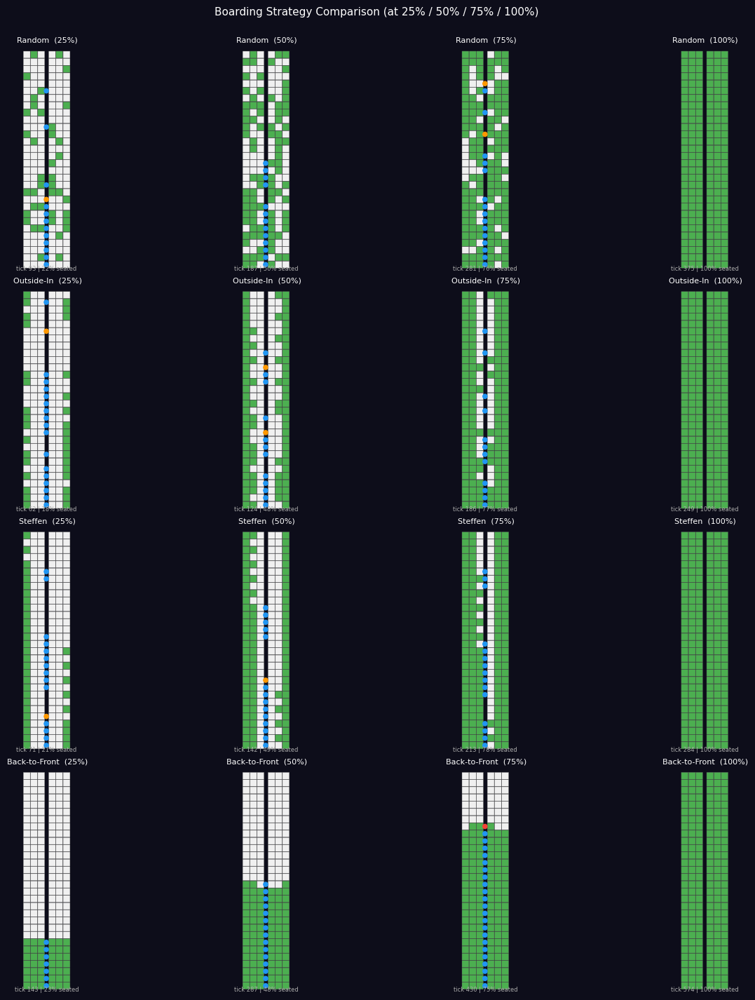

In [11]:
# 전략 4개를 나란히 비교하는 정지 프레임 비교 차트
import json
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

C_EMPTY  = '#f0f0f0'; C_SEATED = '#4CAF50'
C_MOVING = '#2196F3'; C_BAGGAGE = '#FF9800'; C_BLOCKED = '#F44336'

def load_frames(path):
    meta, frames = None, []
    with open(path) as f:
        for line in f:
            obj = json.loads(line)
            if 'meta' in obj: meta = obj['meta']
            elif 'tick' in obj: frames.append(obj)
    return meta, frames

def draw_snapshot(ax, meta, frame, title):
    ROWS, COLS = meta['rows'], meta['cols']
    def sx(c): return c + (0.5 if c >= 3 else 0)
    ax.set_facecolor('#1a1a2e')
    ax.set_xlim(-0.5, COLS + 1.2); ax.set_ylim(-0.5, ROWS + 0.8)
    ax.set_aspect('equal'); ax.axis('off')
    ax.set_title(title, color='white', fontsize=8, pad=3)
    seated = set(tuple(s) for s in frame['seats'])
    for r in range(ROWS):
        for c in range(COLS):
            color = C_SEATED if (r,c) in seated else C_EMPTY
            rect = mpatches.FancyBboxPatch(
                (sx(c)+0.05, ROWS-1-r+0.05), 0.9, 0.9,
                boxstyle='round,pad=0.03', facecolor=color, edgecolor='#555', lw=0.3)
            ax.add_patch(rect)
    for p in frame['aisle']:
        row, sc, _ = p
        color = [C_MOVING, C_BAGGAGE, C_BLOCKED, C_SEATED][sc]
        ax.add_patch(plt.Circle((sx(2)+0.95+0.25, ROWS-1-row+0.5), 0.3, color=color, zorder=3))
    pct = len(seated) / (ROWS*COLS) * 100
    ax.text(COLS/2+0.25, -0.3, f'tick {frame["tick"]} | {pct:.0f}% seated',
            ha='center', fontsize=6, color='#aaaaaa')

strategies = ['random', 'outsidein', 'steffen', 'backtofront']
labels     = ['Random', 'Outside-In', 'Steffen', 'Back-to-Front']
all_data   = [(load_frames(f'sim_{s}.jsonl')) for s in strategies]

# 각 전략의 25%, 50%, 75%, 100% 진행 시점 스냅샷
checkpoints = [0.25, 0.50, 0.75, 1.0]
fig, axes = plt.subplots(len(strategies), len(checkpoints),
                         figsize=(14, 14), facecolor='#0d0d1a')

for row_i, ((meta, frames), label) in enumerate(zip(all_data, labels)):
    for col_i, pct in enumerate(checkpoints):
        fi = min(int(pct * len(frames)) - 1, len(frames)-1)
        fi = max(fi, 0)
        title = f'{label}  ({int(pct*100)}%)'
        draw_snapshot(axes[row_i][col_i], meta, frames[fi], title)

plt.suptitle('Boarding Strategy Comparison (at 25% / 50% / 75% / 100%)',
             color='white', fontsize=11, y=1.01)
plt.tight_layout(pad=0.5)
plt.show()
